# 7c. SABER amplified tag quantification
## 1. Summary
This notebook quantifies channel features and generates the figures associated with the breast cancer TMA scans labelled with SABER amplified metal tags in Figure 5 of the MEZ-XRF paper.

This includes quantifying cell features per channel using the image stack and according to the cell and nuclei segmentation masks generated in the `7a_cell_segmentation` notebook. Both the image stack and masks are held in the hdf outputs of 7a.

In [1]:
import pathlib
import numpy as np
import pandas as pd
import anndata as ad
import scanpy as sc
import squidpy as sq

import h5py
import seaborn as sns
import matplotlib.pyplot as plt
from matplotlib.pyplot import rc_context
from shutil import copyfile

import sys
sys.path.insert(0, '..\\code\\')
import high_plex_hdf as hph
import hph_adata_analysis as hph_adata

In [2]:
# Set data directory to work from 
base_dir = "C:/Users/MerrickS/OneDrive/Work/2_UZH/Papers/1_MEZ_XRF"
base_dir = pathlib.Path(base_dir)
base_dir_sub = base_dir / 'data' / 'processed' / 'xrf'

# Specify the input directory containing hdf deconvoluted files
deconv_dir = base_dir_sub / '2_deconvoluted_hdfs' / 'summary_hdfs'

# Specify the input directory containing hdf files of images and masks
hdf_dir = base_dir_sub / '7a_SABER_cell_segmentation'

# Make output directory segmented images
out_dir = base_dir_sub / '7c_SABER_TMA_quantification'
out_dir.mkdir(parents=True, exist_ok=True)
print('Quantified hdf files will be output to: \n\t', out_dir) 

# Read in scans and original scan metadata
df_hdf_files = pd.read_csv(base_dir_sub / '1_reduced_reshaped_hdfs' / 'preprocessed_hdf_config_files.csv')
df_hdf_metadata = pd.read_csv(base_dir_sub / '1_reduced_reshaped_hdfs' / 'xrf_scan_metadata_full.csv')

Quantified hdf files will be output to: 
	 C:\Users\MerrickS\OneDrive\Work\2_UZH\Papers\1_MEZ_XRF\data\processed\xrf\7c_SABER_TMA_quantification


Identifiy the hdf files to analyse

In [3]:
TMA_standard = {
    #'st_tt_h2_inset_10Hz_0002',
    'st_tt_h2lb2_50Hz_0001' : 'HER2+',
    #'st_tt_h2lb2_250Hz_0001',
    #'st_tt_hl4_inset_10Hz_0001',
    #'st_tt_hl4_inset_50Hz_0002': 'LumB',
    #'st_tt_hl4_250Hz_0001',
    #'st_tt_lb2_inset_10Hz_0001',
    'st_tt_h2lb2_50Hz_0002': 'LumB',
    #'st_tt_h2lb2_250Hz_0002',
    #'st_tt_lbh4_inset_10Hz_0001',
    #'st_tt_lbh4_inset_50Hz_0001': 'LumB HER2+',
    #'st_tt_lbh4_250Hz_0001',
}
hdf_filepaths_TMAstandard = []
for sample in TMA_standard:
    hdf_filepaths_TMAstandard.append(list(hdf_dir.glob(f'{sample}*.h5'))[0])

TMA_balance = {
    #'bl_tt_h2_inset_10Hz_0002' : 'h2',
    'bl_tt_h2_50Hz_0001' : 'HER2+',
    #'bl_tt_h2_250Hz_0001' : 'h2',
    #'bl_tt_lb2_inset1_10Hz_0001' : 'lb2',
    'bl_tt_lb2_50Hz_0001' : 'LumB',
    #'bl_tt_lb2_250Hz_0001' : 'lb2',
    #'bl_tt_lbh4_inset_10Hz_0001' : 'lbh4',
    'bl_tt_lbh4_50Hz_0001' : 'LumB HER2+',
    #'bl_tt_lbh4_250Hz_0001' : 'lbh4',
}
hdf_filepaths_TMAbalance = []
for sample in TMA_balance:
    hdf_filepaths_TMAbalance.append(list(hdf_dir.glob(f'{sample}*.h5'))[0])
    
hdf_filepaths = hdf_filepaths_TMAbalance
for i in hdf_filepaths: print(i)
    

C:\Users\MerrickS\OneDrive\Work\2_UZH\Papers\1_MEZ_XRF\data\processed\xrf\7a_SABER_cell_segmentation\bl_tt_h2_50Hz_0001_normalised_segmented.h5
C:\Users\MerrickS\OneDrive\Work\2_UZH\Papers\1_MEZ_XRF\data\processed\xrf\7a_SABER_cell_segmentation\bl_tt_lb2_50Hz_0001_normalised_segmented.h5
C:\Users\MerrickS\OneDrive\Work\2_UZH\Papers\1_MEZ_XRF\data\processed\xrf\7a_SABER_cell_segmentation\bl_tt_lbh4_50Hz_0001_normalised_segmented.h5


In [4]:
for hdf_fpath in hdf_filepaths_TMAbalance[:1]:
    with h5py.File(hdf_fpath, 'r') as hdf:
        print(hdf['images'].keys())
        print(hdf['masks'].keys())

<KeysViewHDF5 ['1_compton_norm', '2_beam_intensity_norm', 'df_channel_metadata', 'raw']>
<KeysViewHDF5 ['fpico_mask', 'matched_cell_mask', 'matched_non_nuclei_mask', 'matched_nuclei_mask', 'mesmer_cell_mask', 'mesmer_nuclei_mask']>


## 2. Generate annotated data (anndata) objects based on selected image set and selected masks
Create a merged anndata object of using whole cell, nuclear and non-nuclear masks for the cell pellet set of hdf files.

In [5]:
image_n = '2_beam_intensity_norm'

mask_n = 'matched_cell_mask'
adata_TMAbalance = hph.multiple_hph_to_adata(
    hdf_filepaths = hdf_filepaths, 
    image_n = image_n,
    mask_n = mask_n
)
adata_TMAbalance.write(out_dir / 'TMA_balanced_matched_whole_cell.h5ad')

"""
image_n = '2_beam_intensity_norm'

mask_n = 'matched_nuclei_mask'
adata_TMAbalance = hph.multiple_hph_to_adata(
    hdf_filepaths = hdf_filepaths, 
    image_n = image_n,
    mask_n = mask_n
)
adata_TMAbalance.write(out_dir.joinpath('TMA_balanced_matched_nuclear.h5ad'))

image_n = '2_beam_intensity_norm'

mask_n = 'matched_non_nuclei_mask'
adata_TMAbalance = hph.multiple_hph_to_adata(
    hdf_filepaths = hdf_filepaths, 
    image_n = image_n,
    mask_n = mask_n
)
adata_TMAbalance.write(out_dir.joinpath('TMA_balanced_matched_non_nuclear.h5ad'))
"""

... storing 'label_id' as categorical
... storing 'sample_name_ref' as categorical
... storing 'AB_panel' as categorical
... storing 'hph_mask_key' as categorical
... storing 'hph_image_key' as categorical
... storing 'hph_id' as categorical
... storing 'shortname' as categorical


"\nimage_n = '2_beam_intensity_norm'\n\nmask_n = 'matched_nuclei_mask'\nadata_TMAbalance = hph.multiple_hph_to_adata(\n    hdf_filepaths = hdf_filepaths, \n    image_n = image_n,\n    mask_n = mask_n\n)\nadata_TMAbalance.write(out_dir.joinpath('TMA_balanced_matched_nuclear.h5ad'))\n\nimage_n = '2_beam_intensity_norm'\n\nmask_n = 'matched_non_nuclei_mask'\nadata_TMAbalance = hph.multiple_hph_to_adata(\n    hdf_filepaths = hdf_filepaths, \n    image_n = image_n,\n    mask_n = mask_n\n)\nadata_TMAbalance.write(out_dir.joinpath('TMA_balanced_matched_non_nuclear.h5ad'))\n"

In [6]:
image_n = '2_beam_intensity_norm'

mask_n = 'matched_cell_mask'
adata_TMAstandard = hph.multiple_hph_to_adata(
    hdf_filepaths = hdf_filepaths_TMAstandard, 
    image_n = image_n,
    mask_n = mask_n
)
adata_TMAstandard.write(out_dir / 'TMA_standard_matched_whole_cell.h5ad')

... storing 'label_id' as categorical
... storing 'sample_name_ref' as categorical
... storing 'AB_panel' as categorical
... storing 'hph_mask_key' as categorical
... storing 'hph_image_key' as categorical
... storing 'hph_id' as categorical
... storing 'shortname' as categorical


## 3. Generate channel summary images
Reference for each hdf image mask container is stored in the unstructured aspect of `anndata adata.uns['hdf_container_path']`. Images are imported from these hdf containers, which are index matched to variable annotations stored in `adata.var`.

..\code\hph_adata_analysis.py:395: UserWarning: FixedFormatter should only be used together with FixedLocator
  cbar.ax.set_yticklabels(tick_labels_padded)  # vertically oriented colorbar


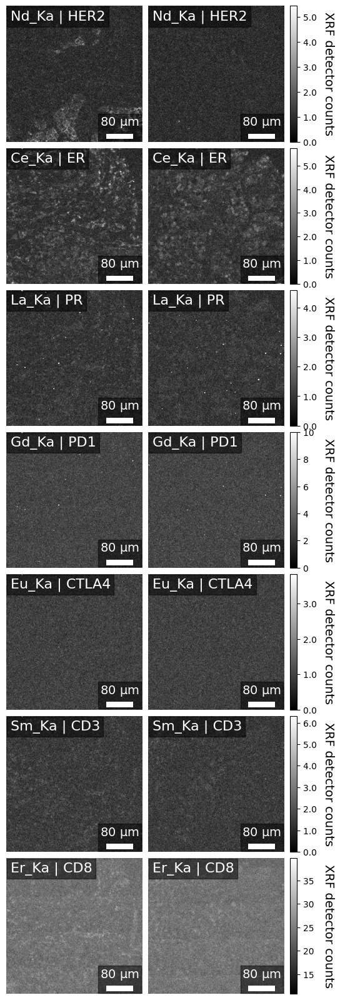

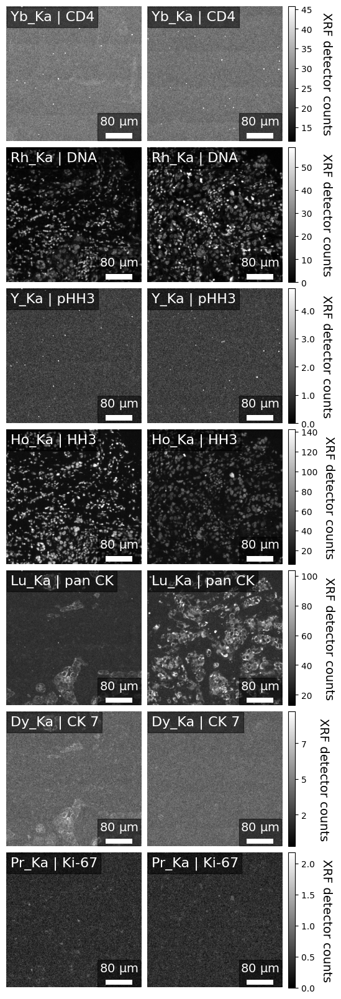

In [7]:
part_a = [
    'Nd_Ka',
    'Ce_Ka',
    'La_Ka',
    'Gd_Ka',
    'Eu_Ka',
    'Sm_Ka',
    'Er_Ka',
]
part_b = [
    'Yb_Ka',
    'Rh_Ka',
    'Y_Ka',
    'Ho_Ka',
    'Lu_Ka',
    'Dy_Ka',   
    'Pr_Ka',
]

hph_adata.adata_hph_channels_plot(
    adata_TMAstandard, 
    plot_name='longname', 
    plot_channels=part_a,
    #list(adata_TMAstandard.var.index),
    hdf_image_key='raw',
#    hdf_ids = [
#        'h2',
#        'lb2',
#        'lbh4',     
    #],
    scale_length=80,
    legend_fontsize=16,
    #power=2
)

hph_adata.adata_hph_channels_plot(
    adata_TMAstandard, 
    plot_name='longname', 
    plot_channels=part_b,
    #list(adata_TMAstandard.var.index),
    hdf_image_key='raw',
#    hdf_ids = [
#        'h2',
#        'lb2',
#        'lbh4',     
    #],
    scale_length=80,
    legend_fontsize=16,
    #power=2
)

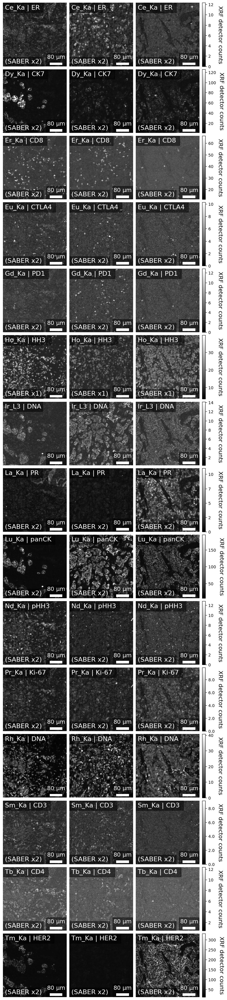

In [8]:
hph_adata.adata_hph_channels_plot(
    adata_TMAbalance, 
    plot_name='longname', 
    plot_name_split='(',
    plot_channels=list(adata_TMAbalance.var.index),
    hdf_image_key='raw',
    hdf_ids = [
        'h2',
        'lb2',
        'lbh4',     
    ],
    scale_length=80,
    legend_fontsize=16,
    #power=2
)


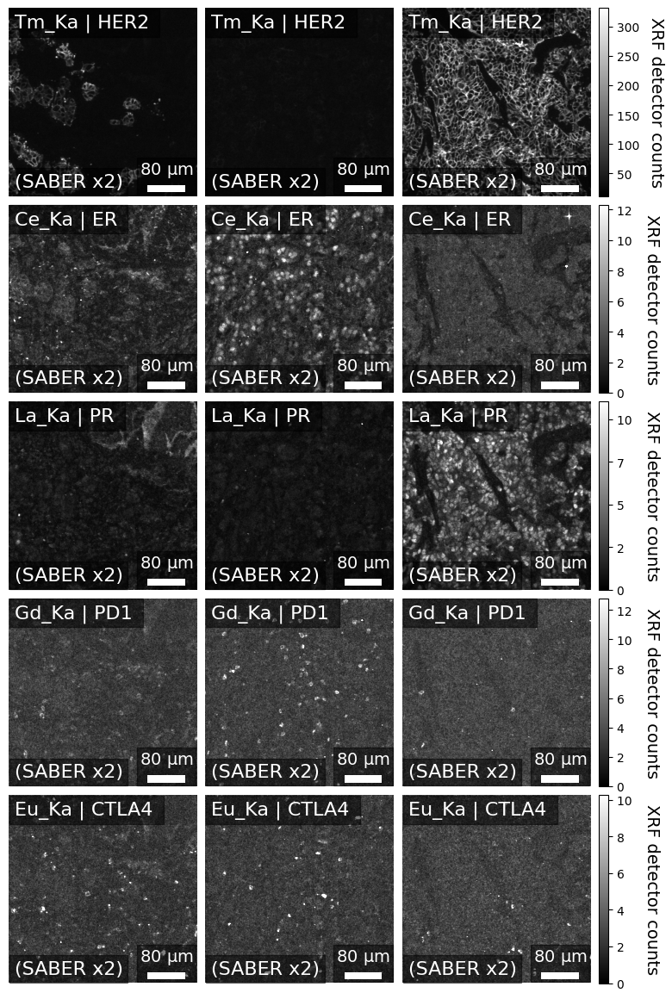

<Figure size 432x288 with 0 Axes>

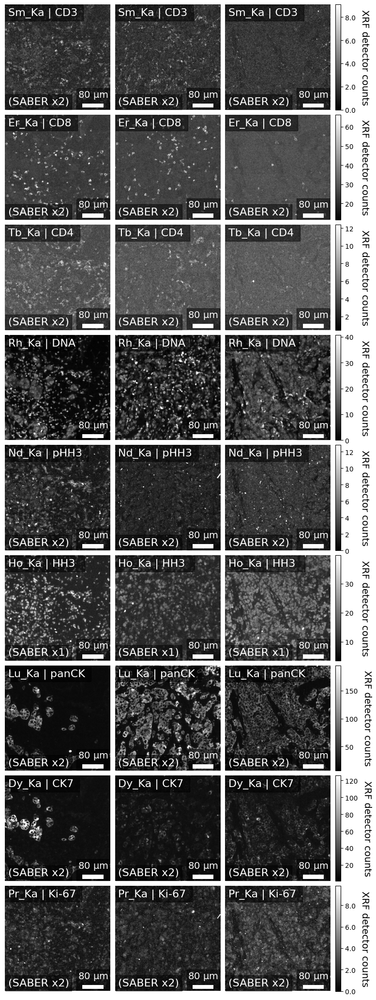

<Figure size 432x288 with 0 Axes>

In [9]:
fig_channels = [
    'Tm_Ka',
    'Ce_Ka',
    'La_Ka',
    'Gd_Ka',
    'Eu_Ka',
]  

fig_channels_2 = [ 
    'Sm_Ka',
    'Er_Ka', 
    'Tb_Ka', 
    'Rh_Ka',
    'Nd_Ka',
    'Ho_Ka',
    'Lu_Ka',
    'Dy_Ka',
    'Pr_Ka'
]  

hph_adata.adata_hph_channels_plot(
    adata_TMAbalance, 
    plot_name='longname', 
    plot_name_split='(',
    plot_channels=fig_channels,
    hdf_image_key='raw',
    hdf_ids = [
        'h2',
        'lb2',
        'lbh4',     
    ],
    scale_length=80,
    legend_fontsize=16,
    save_name= str(out_dir / 'TMA.png')
)

hph_adata.adata_hph_channels_plot(
    adata_TMAbalance, 
    plot_name='longname', 
    plot_name_split='(',
    plot_channels=fig_channels_2,
    hdf_image_key='raw',
    hdf_ids = [
        'h2',
        'lb2',
        'lbh4',     
    ],
    scale_length=80,
    legend_fontsize=16,
    save_name= str(out_dir / 'TMA.png')
)

# hph_adata.adata_hph_channels_plot(
#     adata_TMAbalance, 
#     plot_name='shortname',
#     plot_name_split='(', 
#     plot_channels=fig_channels_3,
#     hdf_image_key='raw',
#     hdf_ids = [
#         'h2',
#         'lb2',
#         'lbh4',     
#     ],
#     scale_length=80,
#     legend_fontsize=16,
#     save_name= str(out_dir / 'TMA.png')
# )

In [10]:
out_dir / 'output.png'

WindowsPath('C:/Users/MerrickS/OneDrive/Work/2_UZH/Papers/1_MEZ_XRF/data/processed/xrf/7c_SABER_TMA_quantification/output.png')

## 4. Cell phenotyping


In [11]:
adata = ad.read_h5ad(out_dir / 'TMA_balanced_matched_whole_cell.h5ad')
adata.raw = adata

In [12]:
adata.var.index

Index(['Ce_Ka', 'Dy_Ka', 'Er_Ka', 'Eu_Ka', 'Gd_Ka', 'Ho_Ka', 'Ir_L3', 'La_Ka',
       'Lu_Ka', 'Nd_Ka', 'Pr_Ka', 'Rh_Ka', 'Sm_Ka', 'Tb_Ka', 'Tm_Ka'],
      dtype='object')

Use `cluster_channels` to make an adata subset of informative feature channels. These will be used to cluster different cell types using normalised channel counts (plotted below against raw counts). 

In [13]:
cluster_channels = [
    'Ce_Ka', 
    'Dy_Ka', 
    'Er_Ka', 
    'Eu_Ka', 
    'Gd_Ka', 
    #'Ho_Ka', 
    #'Ir_L3', 
    'La_Ka',
    'Lu_Ka',
    #'Nd_Ka',
    #'Pr_Ka',
    #'Rh_Ka',
    'Sm_Ka',
    'Tb_Ka',
    'Tm_Ka'
]

cluster_channel_var = []
for i in adata.var.index: 
    cluster_channel_var.append(i in cluster_channels)
adata.var['cluster_channels'] = cluster_channel_var
adata.var['cluster_channels'] = adata.var['cluster_channels'].astype('category')

C:\Users\MerrickS\Anaconda3\envs\mez-xrf\lib\site-packages\pandas\core\arrays\categorical.py:2487: FutureWarning: The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.
  res = method(*args, **kwargs)


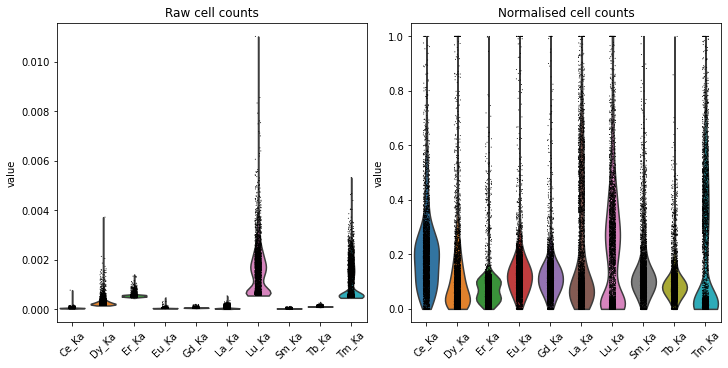

In [14]:
adata = adata[:, adata.var['cluster_channels']==True]

normalised_data = adata.X.copy()
normalised_data = hph_adata.column_percentile_normalise_test(
    normalised_data, 
    2, 
    98, 
    crop=False
)
adata.X = normalised_data

fig, axs = plt.subplots(1, 2, figsize=(10,5), constrained_layout=True)
set_xticklabels = {'labels': list(adata.var_names), 'rotation':45}
g1 = sc.pl.violin(
    adata, 
    adata.var_names, 
    ax=axs[0], 
    show=False, 
    use_raw=True,
    **set_xticklabels
    #set_xticklabels=set_xticklabels
)
g2 = sc.pl.violin(
    adata, 
    adata.var_names, 
    ax=axs[1], 
    show=False, 
    use_raw=False,
    **set_xticklabels
    #set_xticklabels=set_xticklabels
)

axs[0].title.set_text('Raw cell counts')
axs[1].title.set_text('Normalised cell counts')                      

plt.show()

Generate a principal component plot of normalised features

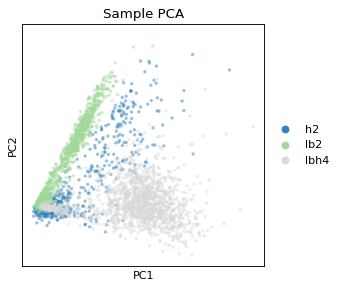

In [15]:
# Principal component analyses
sc.tl.pca(adata, svd_solver='arpack')

# Plot out principal components
fig, axs = plt.subplots(figsize=(4,4), dpi=80)
sc.pl.pca(
    adata, 
    color='sample_name_ref', 
    palette = 'tab20c',
    ax=axs, 
    title='Sample PCA', 
    show=False,
    **{'alpha':0.5}
)
plt.axis('square')
plt.show()

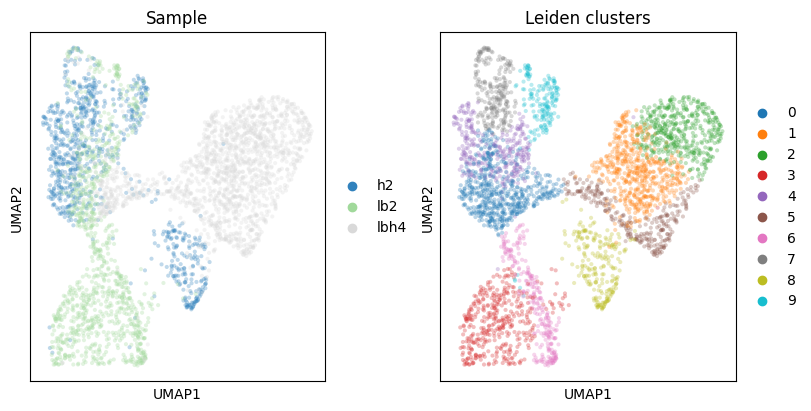

In [16]:
sc.pp.neighbors(adata, n_neighbors=30)
sc.tl.umap(adata, random_state=5)
sc.tl.leiden(adata, resolution=0.7)

fig, axs = plt.subplots(1, 2, figsize=(8,4), dpi=100, constrained_layout=True)
sc.pl.umap(
    adata, 
    color='sample_name_ref',
    palette = 'tab20c',
    ax=axs.flatten()[0], 
    frameon=True, 
    show=False,
    #legend_loc='on data',
    legend_fontoutline=2,
    title = 'Sample',
    **{'alpha':0.3}
    )
sc.pl.umap(
    adata, 
    color='leiden', 
    ax=axs.flatten()[1], 
    frameon=True, 
    show=False,
    title = 'Leiden clusters',
    **{'alpha':0.3}
    )
plt.show()

Project markers onto UMAP

Plot ranked marker differences between leiden clusters

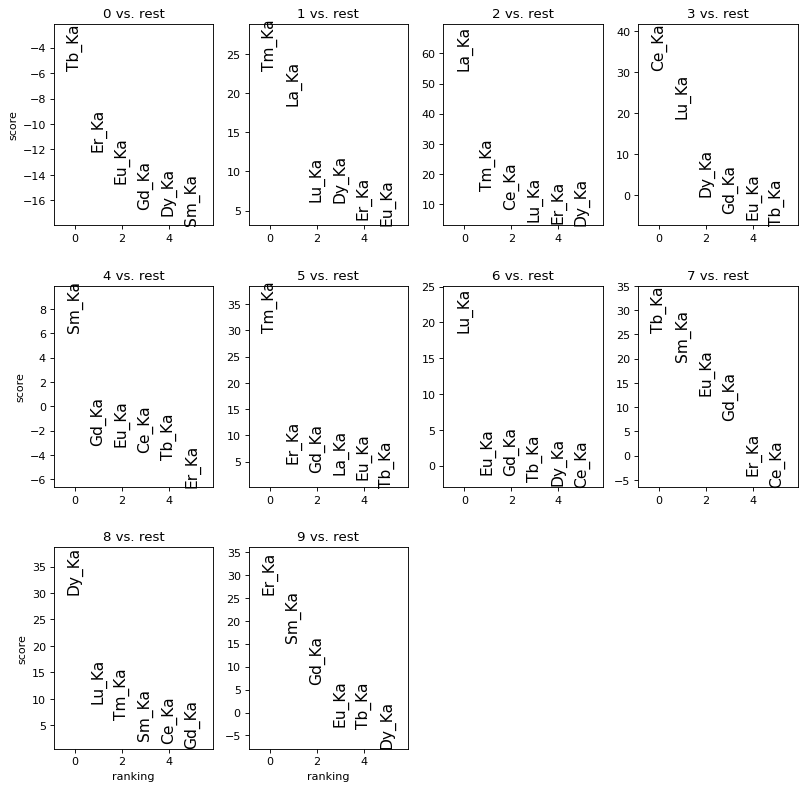

In [17]:
sc.tl.rank_genes_groups(adata, 
                        groupby='leiden', 
                        use_raw=False, 
                        method='t-test_overestim_var', 
                        # method='t-test', 
                        n_genes=6
                        ) # compute differential expression


with rc_context({'figure.figsize': (3, 4), 'figure.dpi': 80}):
    sc.pl.rank_genes_groups(
        adata, 
        groupby='leiden', 
        n_genes=6, 
        ncols=4, 
        sharey=False, 
        fontsize=14
    )
  

In [18]:
cluster2annotation = {
    '0': 'Stromal cells',
    '1': 'HER2$^{+}$ PR$^{+}$ epithelia',
    '2': 'PR$^{+}$ epithelia',
    '3': 'ER$^{+}$ epithelia',
    '4': 'T-cells',
    '5': 'HER2$^{+}$ epithelia',
    '6': 'Epithelial cells',
    '7': 'Exhausted CD4 T-cells',
    '8': 'CK7$^{+}$  epithelia',
    '9': 'PD1$^{+}$  helper T-cells',
}

"""
cluster2annotation = {
    '0': 'PR$^{+}$ epithelia',
    '1': 'stromal cells',
    '2': 'ER$^{+}$ epithelia',
    '3': 'HER2$^{+}$ cells',
    '4': 'exhausted CD4 T-cells',
    '5': 'CK7$^{+}$ epithelia',
    '6': 'PD1$^{+}$ cytotoxic T-cells',
    '7': 'epithelial cells',
}




cluster2annotation = {
    '0': 'stromal cells',
    '1': 'PR$^{+}$ epithelia',
    '2': 'HER2$^{+}$ PR$^{+}$ epithelia',
    '3': 'ER$^{+}$ epithelia',
    '4': 'exhausted CD4 T-cells',
    '5': 'HER2$^{+}$ epithelia',
    '6': 'epithelial cells',
    '7': 'CK7$^{+}$  epithelia',
    '8': 'helper T-cells',
}
"""


# Annotate adata with leiden cell type cluster names
adata.obs['leiden_cluster_names'] = adata.obs['leiden'].map(cluster2annotation).astype('category')
adata.uns['leiden_cluster_names_colors'] = adata.uns['leiden_colors']


In [19]:
adata.uns['leiden_cluster_names_colors'] = adata.uns['leiden_colors']


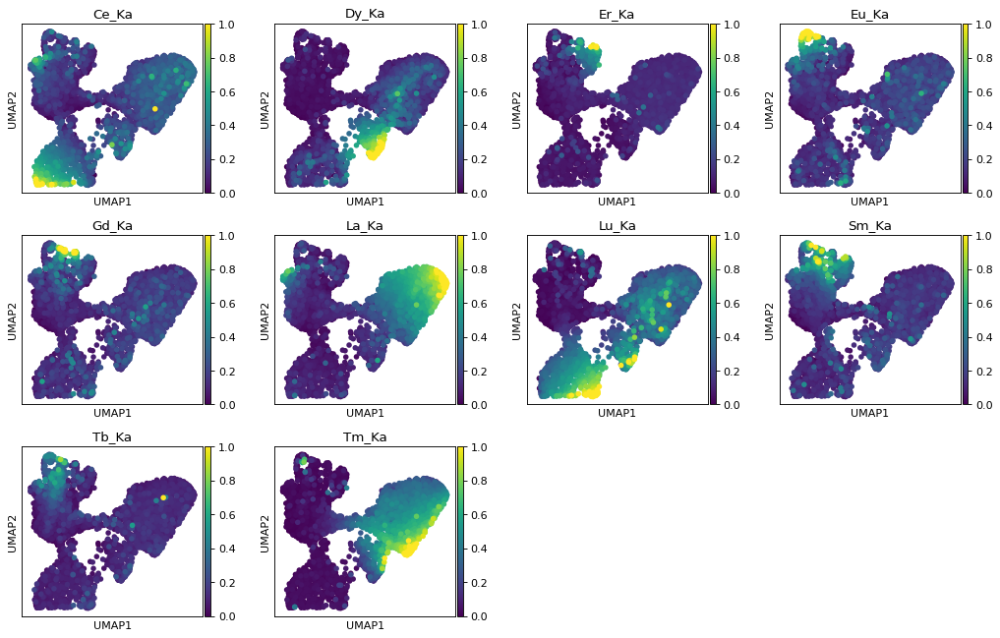

In [20]:
with rc_context({'figure.figsize': (3, 3), 'figure.dpi': 80}):
    sc.pl.umap(
        adata, 
        color=adata.var_names, 
        ncols=4, 
        # frameon=False, 
        show=False, 
        use_raw=False, 
        size=100,
        # legend='off'
    )
plt.show()

In [21]:
samples_path = ['HER2$^{+}$', 'LumB', 'LumB HER2$^{+}$']
samples_path_dict_overview = dict(
    zip(
        list(['h2', 'lb2', 'lbh4']),
        samples_path
    )
)
adata.obs['sample_pathology_names'] = adata.obs['sample_name_ref'].map(samples_path_dict_overview)

Plot annotated leiden clusters alongside sample groundtruth

C:\Users\MerrickS\OneDrive\Work\2_UZH\Papers\1_MEZ_XRF\data\processed\xrf\7c_SABER_TMA_quantification\Fig5F_BreastSampleUMAPXRF.svg


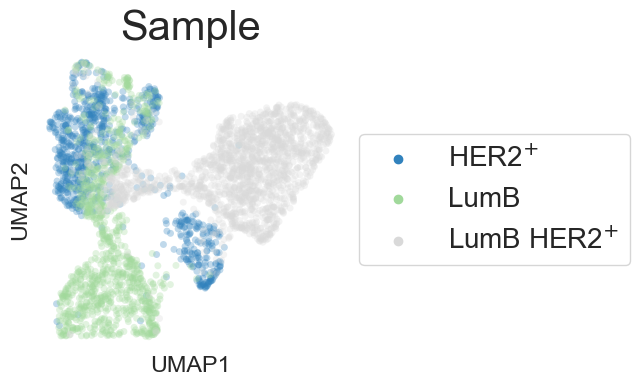

In [29]:
fig, axs = plt.subplots(figsize=(4,4), dpi=100)#, constrained_layout=True)
sns.set(font_scale=2.5)

g1 = sc.pl.umap(
    adata, 
    color='sample_pathology_names',
    palette = 'tab20c',
    ax=axs, 
    frameon=True, 
    show=False,
    #legend_loc='on data',
    gene_symbols={"h2":"1","lb2":"2", "lbh4":"3"},
    legend_fontoutline=2,
    title = 'Sample',
    size=100,
    **{'alpha':0.3}
    )


axs.set_facecolor('white')
axs.legend(loc='center left', bbox_to_anchor=(1, 0.5), facecolor='white', prop={'size': 20})

savename = out_dir / 'Fig5F_BreastSampleUMAPXRF.svg'
print(savename)
plt.savefig(savename, bbox_inches='tight')

plt.show()


C:\Users\MerrickS\OneDrive\Work\2_UZH\Papers\1_MEZ_XRF\data\processed\xrf\7c_SABER_TMA_quantification\Fig5G_BreastLeidenUMAPXRF.svg


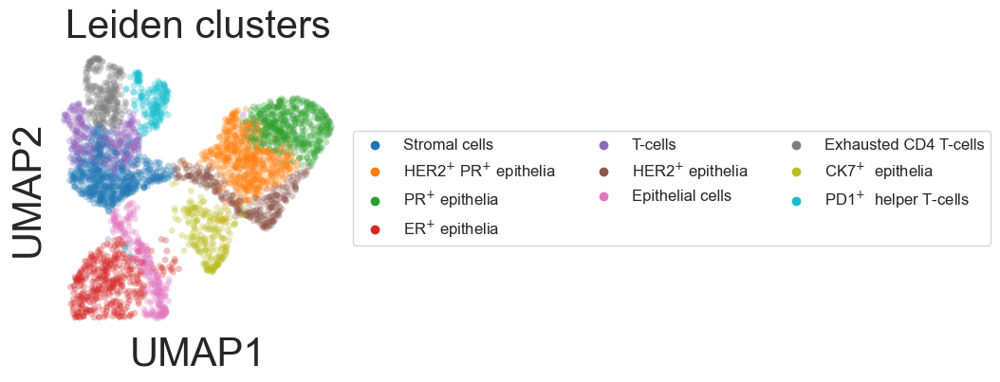

In [23]:
fig, axs = plt.subplots(figsize=(4,4), dpi=100)#, constrained_layout=True)
sns.set(font_scale=2.5)

g1 = sc.pl.umap(
    adata, 
    color='leiden_cluster_names',
    ax=axs, 
    frameon=True, 
    show=False,
    #legend_loc='on data',
    gene_symbols={"h2":"1","lb2":"2", "lbh4":"3"},
    legend_fontoutline=2,
    title = 'Leiden clusters',
    size=100,
    **{'alpha':0.3}
    )

axs.set_facecolor('white')
axs.legend(ncol=3, loc='center left', bbox_to_anchor=(1, 0.5), facecolor='white', prop={'size': 12})

savename = out_dir / 'Fig5G_BreastLeidenUMAPXRF.svg'
print(savename)
plt.savefig(savename, bbox_inches='tight')

plt.show()

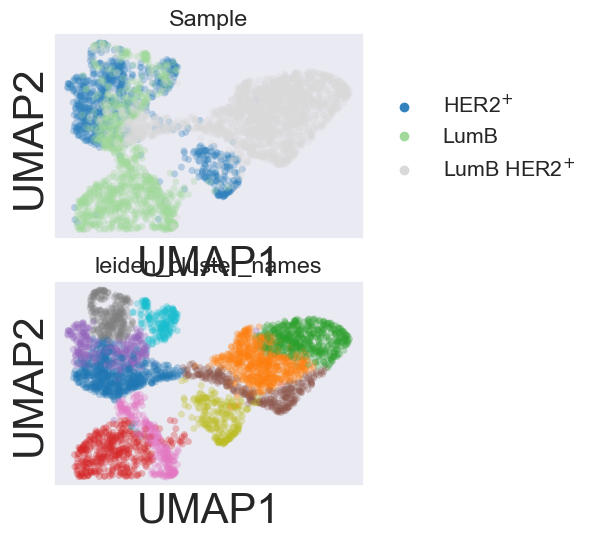

In [24]:
fig, axs = plt.subplots(2, 1, figsize=(4,6), dpi=100)#, constrained_layout=True)
sns.set(font_scale=1.4)
g1 = sc.pl.umap(
    adata, 
    color='sample_pathology_names',
    palette = 'tab20c',
    ax=axs.flatten()[0], 
    frameon=True, 
    show=False,
    #legend_loc='on data',
    gene_symbols={"h2":"1","lb2":"2", "lbh4":"3"},
    legend_fontoutline=2,
    title = 'Sample',
    size=100,
    **{'alpha':0.3}
    )
g2 = sc.pl.umap(
    adata, 
    color='leiden_cluster_names', 
    ax=axs.flatten()[1], 
    frameon=True, 
    show=False,
    legend_loc='below',
    legend_fontoutline=2,
    size=100,
    **{'alpha':0.3}
    )

#g2.legend(fontsize='xx-large', ncol=4,handleheight=2.4, labelspacing=0.05)

#axs.flatten()[0] = g1
#axs.flatten()[1] = g2

#axs.flatten()[1].legend(fontsize='xx-large', ncol=4,handleheight=2.4, labelspacing=0.05)


#fig.tight_layout(pad=1)
plt.show()


Plot clusters back to mask inputs from anndata

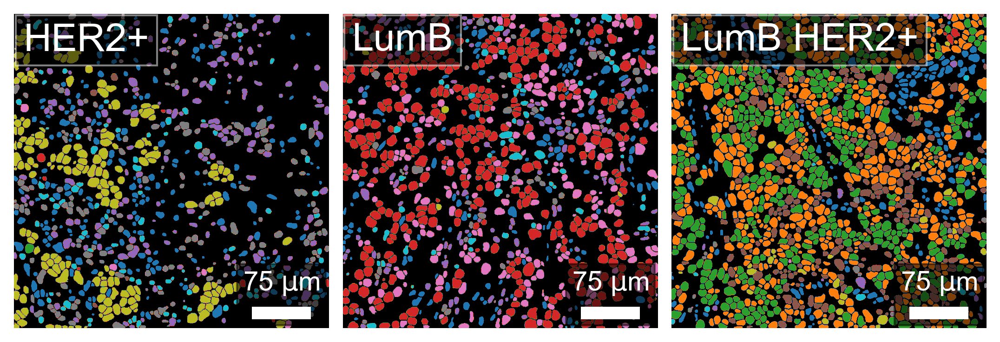

In [25]:
hph_adata.adata_hph_mask_cluster_plot(
        adata=adata,
        cluster_name='leiden',
    plot_names = ['HER2+', 'LumB', 'LumB HER2+']
    )


Restore all feature channels to plot heatmap per cell

In [26]:
adata = adata.raw.to_adata()

In [27]:
adata.obsm['X_umap'].shape

(3409, 2)

C:\Users\MerrickS\Anaconda3\envs\mez-xrf\lib\site-packages\pandas\core\arrays\categorical.py:2487: FutureWarning: The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.
  res = method(*args, **kwargs)
C:\Users\MerrickS\Anaconda3\envs\mez-xrf\lib\site-packages\pandas\core\arrays\categorical.py:2487: FutureWarning: The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.
  res = method(*args, **kwargs)
C:\Users\MerrickS\Anaconda3\envs\mez-xrf\lib\site-packages\pandas\core\arrays\categorical.py:2487: FutureWarning: The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.
  res = method(*args, **kwargs)
C:\Users\MerrickS\Anaconda3\envs\mez-xrf\lib\site-packages\pandas\core\arrays\categorical.py:2487: FutureWarning: The `inplace` parameter in pandas.Categorical.remove_unused_categories

0 Ce_Ka
Ce_Ka | ER 
1 Dy_Ka
Dy_Ka | CK7 
2 Er_Ka
Er_Ka | CD8 
3 Eu_Ka
Eu_Ka | CTLA4 
4 Gd_Ka
Gd_Ka | PD1 
5 Ho_Ka
Ho_Ka | HH3  
6 La_Ka
La_Ka | PR 
7 Lu_Ka
Lu_Ka | panCK 
8 Nd_Ka
Nd_Ka | pHH3 


C:\Users\MerrickS\Anaconda3\envs\mez-xrf\lib\site-packages\pandas\core\arrays\categorical.py:2487: FutureWarning: The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.
  res = method(*args, **kwargs)
C:\Users\MerrickS\Anaconda3\envs\mez-xrf\lib\site-packages\pandas\core\arrays\categorical.py:2487: FutureWarning: The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.
  res = method(*args, **kwargs)
C:\Users\MerrickS\Anaconda3\envs\mez-xrf\lib\site-packages\pandas\core\arrays\categorical.py:2487: FutureWarning: The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.
  res = method(*args, **kwargs)


9 Pr_Ka
Pr_Ka | Ki-67 
10 Rh_Ka
Rh_Ka | DNA
11 Sm_Ka
Sm_Ka | CD3 
12 Tb_Ka
Tb_Ka | CD4 
13 Tm_Ka
Tm_Ka | HER2 


C:\Users\MerrickS\Anaconda3\envs\mez-xrf\lib\site-packages\pandas\core\arrays\categorical.py:2487: FutureWarning: The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.
  res = method(*args, **kwargs)
C:\Users\MerrickS\Anaconda3\envs\mez-xrf\lib\site-packages\pandas\core\arrays\categorical.py:2487: FutureWarning: The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.
  res = method(*args, **kwargs)
C:\Users\MerrickS\Anaconda3\envs\mez-xrf\lib\site-packages\pandas\core\arrays\categorical.py:2487: FutureWarning: The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.
  res = method(*args, **kwargs)
C:\Users\MerrickS\Anaconda3\envs\mez-xrf\lib\site-packages\pandas\core\arrays\categorical.py:2487: FutureWarning: The `inplace` parameter in pandas.Categorical.remove_unused_categories

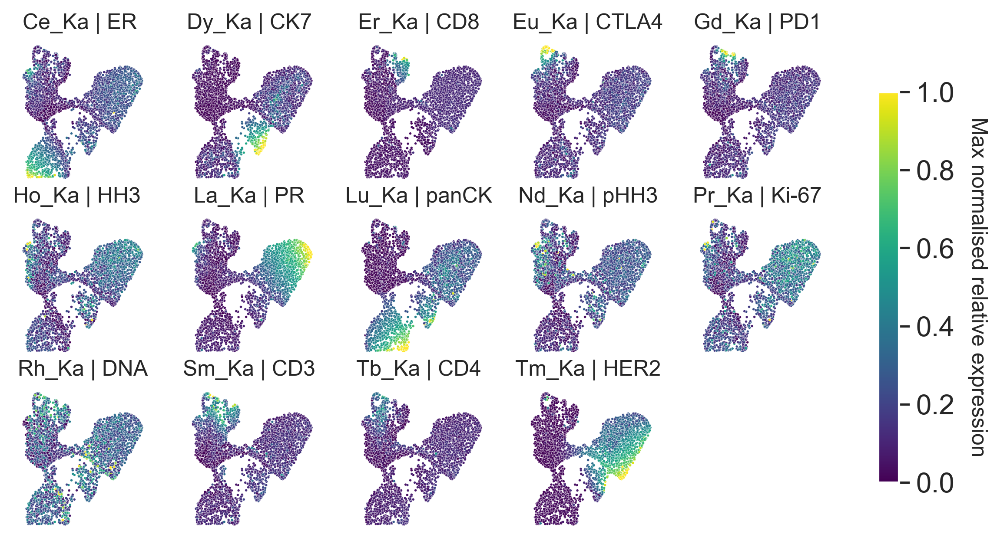

In [28]:
# Resetting the normalised data
normalised_data = adata.X.copy()
normalised_data = hph_adata.column_percentile_normalise_test(normalised_data, 2, 98, crop=False)
adata.X = normalised_data

channels = [i for i in adata.var_names if 'Ir' not in i]

fig, axes = plt.subplots(ncols=5, nrows=3, figsize=(8,5), dpi=300, constrained_layout="True", gridspec_kw={'wspace': 0.3, 'hspace': 0.2})

#fig.set_constrained_layout_pads(w_pad=4 / 72, h_pad=4 / 72, hspace=0, wspace=0.4)
sns.set(font_scale=1.4)

axs=axes.ravel()

x = list(adata.obsm['X_umap'][:,0])
y = list(adata.obsm['X_umap'][:,1])
df_umap = pd.DataFrame()
df_umap['x'] = x
df_umap['y'] = y

for i, channel in enumerate(channels):
    channel_values = adata[:, channel].X
    df_umap['color'] = [i[0] for i in channel_values]
    channel_values
    
    sns.scatterplot(
        data=df_umap,
        x='x',
        y='y',
        hue='color', 
        palette='viridis',
        ax=axs[i],
        legend=False,
        s=2,
        alpha=1,        
    )
    print(i, channel)
    
    title_elements = [adata.var['longname'][adata.var_names==channel][0] for i in channels][0]#
    if "Rh" not in title_elements:
        title_elements = title_elements.rpartition('(')[0]
    print(title_elements)
    axs[i].set_title(title_elements, size=12)
    axs[i].axis('off')
    
    
import matplotlib.cm as cm
from matplotlib.colors import Normalize

    
fig.subplots_adjust(right=0.9)
cbar_ax = fig.add_axes([0.95, 0.2, 0.02, 0.6]) # x0, y0, width, height

normalizer=Normalize(0,1)
cbar = fig.colorbar(
    cm.ScalarMappable(norm=normalizer, cmap='viridis'), 
    cax=cbar_ax, 
    shrink=0.1,
)#, pad=0.04)

cbar.set_label('Max normalised relative expression', rotation=270, labelpad=18, fontsize = 12)

axs[-1].axis('off')
    
plt.show()